# 5OB1CC Strategy Analysis

Combined analysis notebook for the 5-minute Order Block 1-minute Confirmation Candle strategy.

In [12]:
# Import required libraries
from IPython.display import display, HTML
import sys
import importlib

# Add strategy path
sys.path.insert(0, '../strategies/5OB1CC')

# Enable automatic reloading of modules
%load_ext autoreload
%autoreload 2

# Import utility functions
from utils import load_and_clean_data
from utils.tables import (
    display_session_analysis,
    display_30m_leg_analysis,
    display_pullback_analysis,
    display_sl_distribution_analysis,
    display_tp_distribution_analysis,
    display_sl_reduction_analysis,
    display_ema_30m_trend_analysis,
    display_triple_setup_strategy_analysis
)
from utils.charts import (
    display_single_setup_strategy_charts,
    display_double_setup_strategy_charts,
    display_triple_setup_strategy_charts
)
from utils.correlations import display_all_correlations
from utils.export import export_strategy_trades_to_csv
from utils.hours import display_hour_analysis
from utils.weekdays import display_weekday_analysis
from utils.optimizer import optimize_strategies, display_optimization_results
from utils.ema import display_ema_analysis
from utils.singles import display_single_setup_analysis
from utils.doubles import display_double_setup_analysis

# Load the data
df = load_and_clean_data()

# Disable scrolling
HTML('<style>.jp-OutputArea { max-height: none !important; }</style>')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Tables Analysis

In [13]:
display_session_analysis(df)
display_30m_leg_analysis(df)
display_sl_distribution_analysis(df)
display_tp_distribution_analysis(df)
display_pullback_analysis(df)
display_sl_reduction_analysis(df)
display_ema_30m_trend_analysis(df)
display_triple_setup_strategy_analysis(df)

,30M Leg,RRR,Trades,Wins,Losses,Outcome,Win %
1,Below H,1:1,198,88,110,-22R,44.4%
2,,1:2,198,71,127,15R,35.9%
3,,1:3,198,55,143,22R,27.8%
4,Below L,1:1,273,106,167,-61R,38.8%
5,,1:2,273,82,191,-27R,30.0%
6,,1:3,273,69,204,3R,25.3%
7,Above L,1:1,293,108,185,-77R,36.9%
8,,1:2,293,80,213,-53R,27.3%
9,,1:3,293,64,229,-37R,21.8%
10,Above H,1:1,338,152,186,-34R,45.0%


,SL Range,RRR,Trades,Wins,Losses,Outcome,Win %
1,SL < 1,1:1,5,0,5,-5R,0.0%
2,,1:2,5,0,5,-5R,0.0%
3,,1:3,5,0,5,-5R,0.0%
4,1 ≤ SL < 5,1:1,524,170,354,-184R,32.4%
5,,1:2,524,146,378,-86R,27.9%
6,,1:3,524,118,406,-52R,22.5%
7,5 ≤ SL < 10,1:1,451,223,228,-5R,49.4%
8,,1:2,451,164,287,41R,36.4%
9,,1:3,451,126,325,53R,27.9%
10,10 ≤ SL < 15,1:1,84,41,43,-2R,48.8%


,TP Range,RRR,Trades,Wins,Losses,Win %
1,TP < 10,1:1,90,68,22,75.6%
2,,1:2,90,21,69,23.3%
3,,1:3,90,5,85,5.6%
4,10 ≤ TP < 20,1:1,156,140,16,89.7%
5,,1:2,156,95,61,60.9%
6,,1:3,156,54,102,34.6%
7,20 ≤ TP < 30,1:1,84,80,4,95.2%
8,,1:2,84,67,17,79.8%
9,,1:3,84,57,27,67.9%
10,TP ≥ 30,1:1,170,166,4,97.6%


,Type,RRR,Trades,Wins,Losses,Outcome,Win %
1,No Pullback,1:1,1102,454,648,-194R,41.2%
2,,1:2,1102,346,756,-64R,31.4%
3,,1:3,1102,272,830,-14R,24.7%
4,0.5 pip Pullback,1:1,1090,449,641,-192R,41.2%
5,,1:2,1090,342,748,-64R,31.4%
6,,1:3,1090,268,822,-18R,24.6%
7,1 pip Pullback,1:1,974,342,632,-290R,35.1%
8,,1:2,974,255,719,-209R,26.2%
9,,1:3,974,198,776,-182R,20.3%
10,2 pip Pullback,1:1,819,235,584,-349R,28.7%


,Type,RRR,Trades,Wins,Losses,Outcome,Win %
1,No adjustment,1:1,1102,454,648,-194R,41.2%
2,,1:2,1102,346,756,-64R,31.4%
3,,1:3,1102,272,830,-14R,24.7%
4,1 pip reduction,1:1,1102,402,700,-298R,36.5%
5,,1:2,1102,338,764,-88R,30.7%
6,,1:3,1102,269,833,-26R,24.4%
7,2 pips reduction,1:1,1102,336,766,-430R,30.5%
8,,1:2,1102,293,809,-223R,26.6%
9,,1:3,1102,248,854,-110R,22.5%
10,1 pip reduction or max 4 pip SL,1:1,1102,325,777,-452R,29.5%


,Scenario,RRR,Trades,Wins,Losses,Win %
1,Plain trading,1:1,1102,454,648,41.2%
2,,1:2,1102,346,756,31.4%
3,,1:3,1102,272,830,24.7%
4,EMA aligned with trade,1:1,703,297,406,42.2%
5,,1:2,703,227,476,32.3%
6,,1:3,703,179,524,25.5%
7,EMA + BOS,1:1,587,250,337,42.6%
8,,1:2,587,192,395,32.7%
9,,1:3,587,153,434,26.1%
10,30M Trend aligned with trade,1:1,622,267,355,42.9%


,Strategy,RRR,Trades,Wins,Losses,Win Rate,Edge,Outcome,Trades Required,Drawdown
1,30M Trend + 5 < SL < 10,1:2,243,93,150,38.3%,5.0%,36R,6.8,14
2,30M Trend + EMA + BOS + SL < 10,1:3,361,105,256,29.1%,4.1%,59R,6.1,20
3,30M Trend + 5 < SL < 10,1:3,243,70,173,28.8%,3.8%,37R,6.6,16
4,30M Trend + BOS + SL < 10,1:3,414,117,297,28.3%,3.3%,54R,7.7,24
5,EMA + BOS + 30M Trend,1:3,409,115,294,28.1%,3.1%,51R,8.0,24
6,30M Trend + EMA + BOS,1:3,409,115,294,28.1%,3.1%,51R,8.0,24
7,30M Trend + 5 < SL < 15,1:2,292,106,186,36.3%,3.0%,26R,11.2,13
8,30M Trend + 5 < SL < 15,1:3,292,81,211,27.7%,2.7%,32R,9.1,17
9,EMA + BOS + SL < 10 + No News,1:3,312,86,226,27.6%,2.6%,32R,9.8,24
10,EMA + BOS + 3 < SL < 10 + No News,1:3,255,70,185,27.5%,2.5%,25R,10.2,26


## Single Setup Strategy Analysis

In [14]:
display_single_setup_analysis(df)

display(HTML("""
    <h2>Insights</h2>
    <p>EMA, BOS and 30M Trend giving really close results when traded alone.</p>
    <p>Previously my best strategy was based on "EMA", but this shows that "core" idea could be other two too.</p>
    <p>Tested out 30M Continuation and 30M Reversal, but they produced 2-3 times less trades. So they are not equally comparable to all three above.</p>
"""))

Strategy,RRR,Trades,Notation,Win Rate,Edge,Outcome,Days,Days %,Factor
30M Trend,1:3,622,164W – 458L,26.4%,1.4%,34R,94,61%,1.07
EMA Aligned,1:3,703,179W – 524L,25.5%,0.5%,13R,99,64%,1.02
BOS Only,1:3,757,190W – 567L,25.1%,0.1%,3R,106,68%,1.01


## Double Setup Strategy Analysis

In [15]:
display_double_setup_analysis(df)

display(HTML("""
    <h2>Insights</h2>
    <p>The edge increased from 1 to max 5% which is great improvement from "singles" analysis.</p>
    <p>Looks like the second core of the strategy is 5 < SL < 10.</p>
    <p>Decent list of profitable 1:2 RRR and 1:3 RRR setups.</p>
    <p>SL > 3 outperformed SL > 2, so some limit is definitely needed for SL.</p>
    <p>No profitable setup where SL would be below 5 pips means that this is the minimum SL that can be used.</p>
    <p>Filtration of too small SL might mean that there is a lot of noise in the market that needs to be filtered out.</p>
    <p>Unable to find any profitable setups with pullbacks. Do not trade limit orders, only market execution.</p>
    <p>News or No News - no difference in results.</p>
    <p>Tested out 1:4 RRR, but it appeared four times only at the end of the sample, so removed.</p>
    <p>One more push/improvement and it will be a profitable strategy?</p>
    <p>Sounds like I need to focus on figuring out another confluence. Maybe 30M EMA(50), 30M Location (OB, pullback), or something else.</p>
    <p>My path going forward: track a new data set; include more potential confluence combinations; trade live with EMA Aligned + SL 5-10.</p>
"""))

Strategy,RRR,Trades,Notation,Win Rate,Edge,Outcome,Days,Days %,Factor
EMA + BOS + SL 5-10,1:3,224,68W – 156L,30.4%,5.4%,48R,48,42%,1.31
EMA Aligned + SL 5-10,1:3,279,82W – 197L,29.4%,4.4%,49R,57,45%,1.25
30M Trend + SL 5-10,1:3,243,70W – 173L,28.8%,3.8%,37R,56,45%,1.21
30M Trend + BOS + SL 5-10,1:3,183,52W – 131L,28.4%,3.4%,25R,41,39%,1.19
BOS + SL 5-10,1:3,286,81W – 205L,28.3%,3.3%,38R,57,44%,1.19
EMA + 30M Trend + SL 5-10,1:3,188,53W – 135L,28.2%,3.2%,24R,41,37%,1.18
30M Trend + BOS + SL 4-10,1:3,247,69W – 178L,27.9%,2.9%,29R,48,39%,1.16
30M Trend + BOS + SL 1-10,1:3,412,115W – 297L,27.9%,2.9%,48R,75,52%,1.16
30M Trend + BOS + SL < 10,1:3,414,115W – 299L,27.8%,2.8%,46R,75,52%,1.15
30M Trend + BOS + SL 3-10,1:3,332,92W – 240L,27.7%,2.7%,36R,62,46%,1.15


## EMA Strategy Analysis

In [16]:
display_ema_analysis(df)

Strategy,RRR,Trades,Notation,Win Rate,Outcome,Edge,Days,Days %,Trades Required
EMA + BOS + No News + 5 < SL < 10,1:2,151,61W – 90L,40.4%,32R,7.1%,41,48%,4.7
EMA + No News + 5 < SL < 10,1:2,179,71W – 108L,39.7%,34R,6.4%,46,51%,5.3
EMA + BOS + No News + 5 < SL < 10,1:1,151,85W – 66L,56.3%,19R,6.3%,54,64%,7.9
⚠️ EMA + BOS + 5 < SL < 10,1:2,224,88W – 136L,39.3%,40R,6.0%,59,51%,5.6
EMA + BOS + No News + 5 < SL < 10,1:3,151,46W – 105L,30.5%,33R,5.5%,31,36%,4.6
⚠️ EMA + BOS + 5 < SL < 10,1:3,224,68W – 156L,30.4%,48R,5.4%,48,42%,4.7
EMA + No News + 5 < SL < 10,1:1,179,99W – 80L,55.3%,19R,5.3%,60,66%,9.4
EMA + BOS + 30M Trend + 5 < SL < 10,1:2,159,61W – 98L,38.4%,24R,5.1%,44,44%,6.6
EMA Aligned + 5 < SL < 10,1:2,279,106W – 173L,38.0%,39R,4.7%,70,55%,7.2
EMA Aligned + 5 < SL < 10,1:3,279,82W – 197L,29.4%,49R,4.4%,57,45%,5.7


## Hour Analysis

In [17]:
display_hour_analysis(df)

display(HTML("""
    <h2>Insights</h2>
    <p>All outcomes are very similar, so it is safe to say that the strategy is not affected by the hour of the day.</p>
"""))

Strategy,RRR,Trades,Notation,Win Rate,Outcome,Edge,Days,Days %,Trades Required
10h,1:1,156,73W – 83L,46.8%,-10R,-3.2%,61,55%,
11h,1:1,136,52W – 84L,38.2%,-32R,-11.8%,48,48%,
12h,1:1,118,40W – 78L,33.9%,-38R,-16.1%,36,40%,
13h,1:1,120,46W – 74L,38.3%,-28R,-11.7%,44,46%,
14h,1:1,108,44W – 64L,40.7%,-20R,-9.3%,42,51%,
15h,1:1,117,48W – 69L,41.0%,-21R,-9.0%,43,47%,
16h,1:1,120,52W – 68L,43.3%,-16R,-6.7%,48,53%,
17h,1:1,123,59W – 64L,48.0%,-5R,-2.0%,48,51%,
18h,1:1,104,40W – 64L,38.5%,-24R,-11.5%,35,42%,


## Weekday Analysis

In [18]:
display_weekday_analysis(df)

display(HTML("""
    <h2>Insights</h2>
    <p>All outcomes are very similar, so it is safe to say that the strategy is not affected by the hour of the day.</p>
"""))

Strategy,RRR,Trades,Notation,Win Rate,Outcome,Edge,Days,Days %,Trades Required
Monday,1:1,239,95W – 144L,39.7%,-49R,-10.3%,30,94%,
Tuesday,1:1,214,97W – 117L,45.3%,-20R,-4.7%,30,94%,
Wednesday,1:1,229,89W – 140L,38.9%,-51R,-11.1%,32,100%,
Thursday,1:1,227,92W – 135L,40.5%,-43R,-9.5%,30,97%,
Friday,1:1,193,81W – 112L,42.0%,-31R,-8.0%,27,87%,


## Correlation Analysis

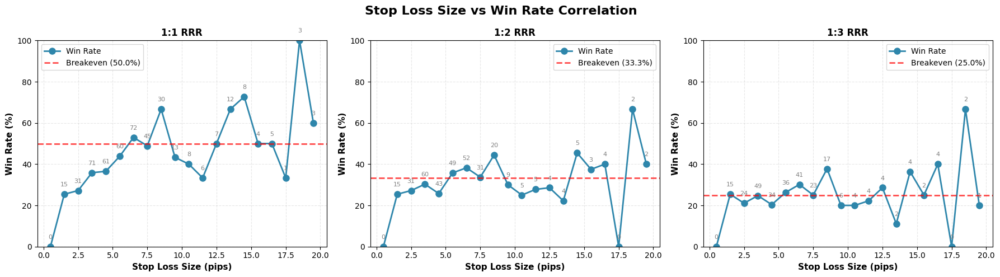

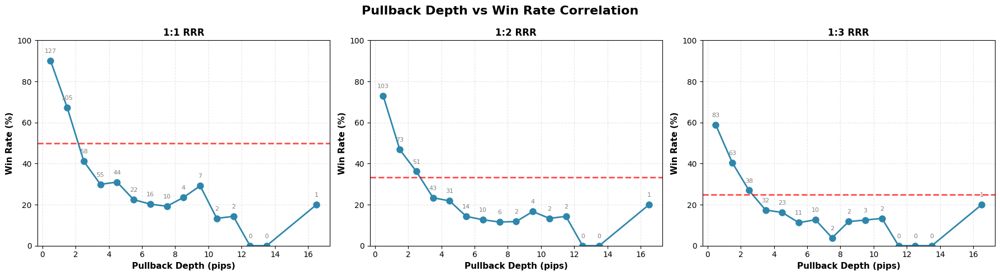

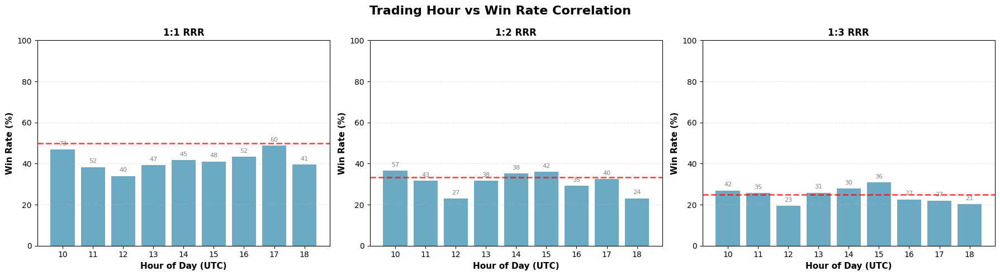

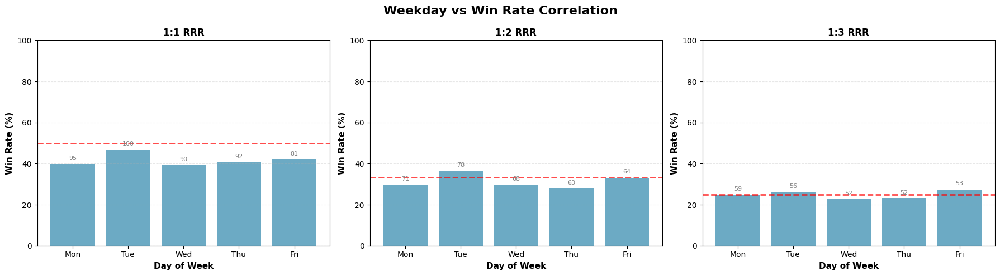

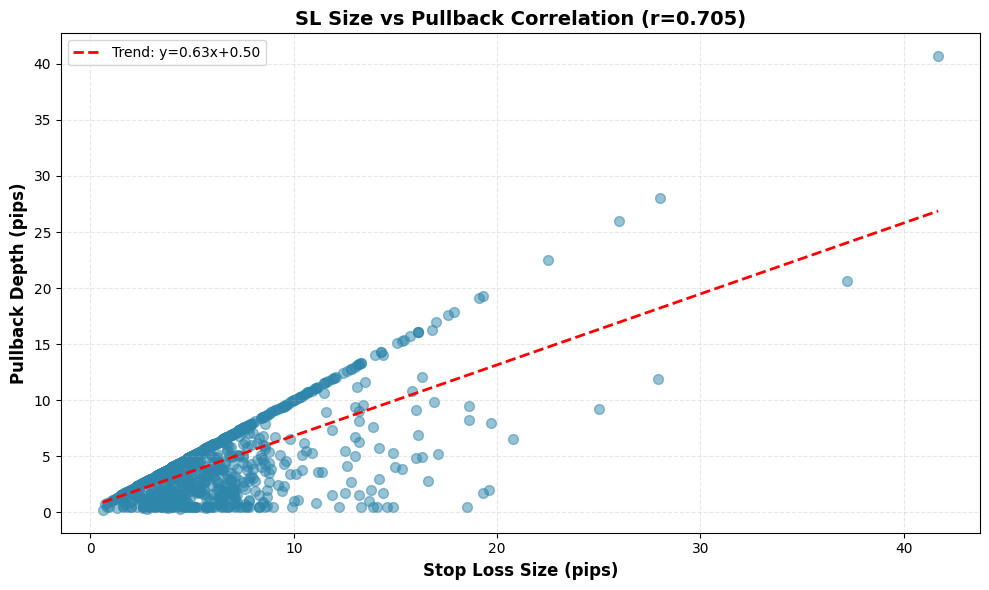

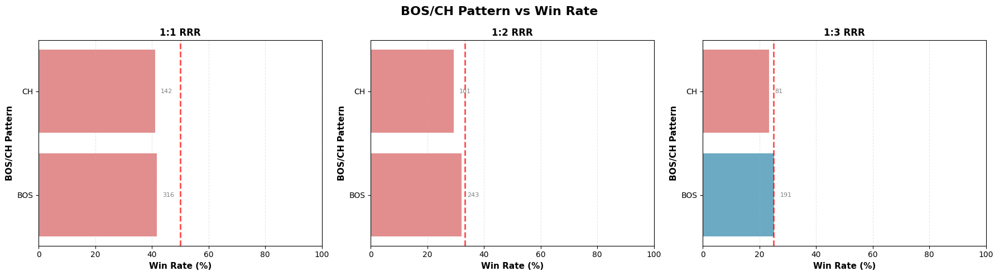

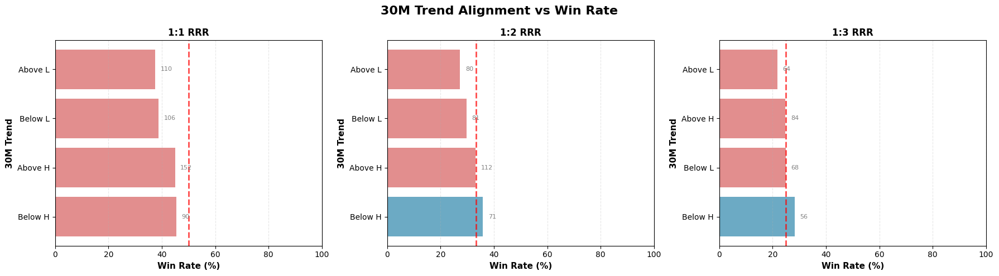

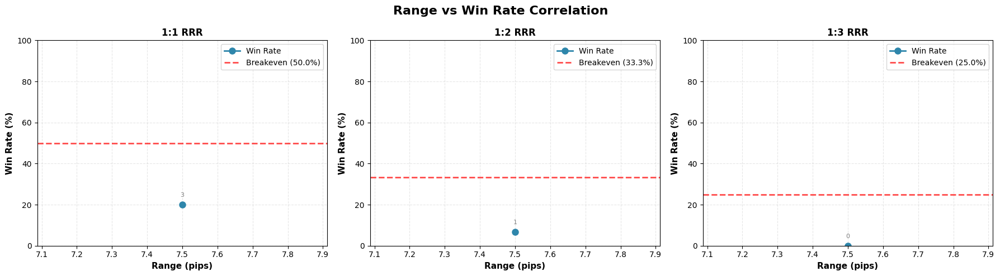

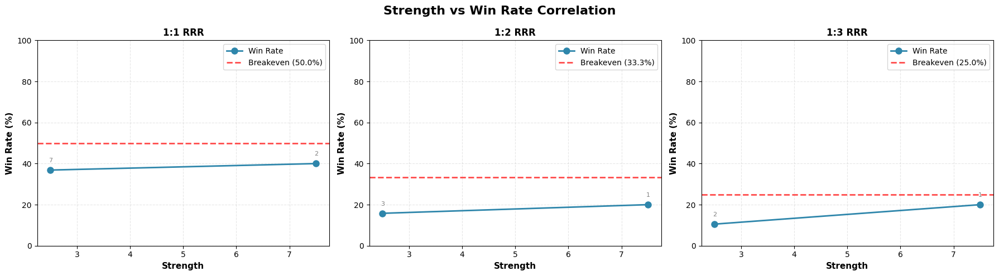

In [19]:
display_all_correlations(df)

## Strategy Charts

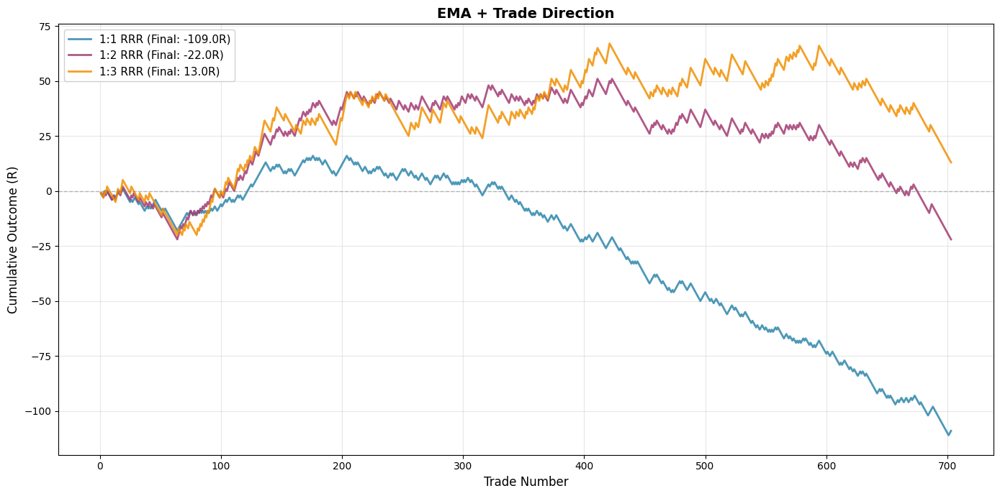

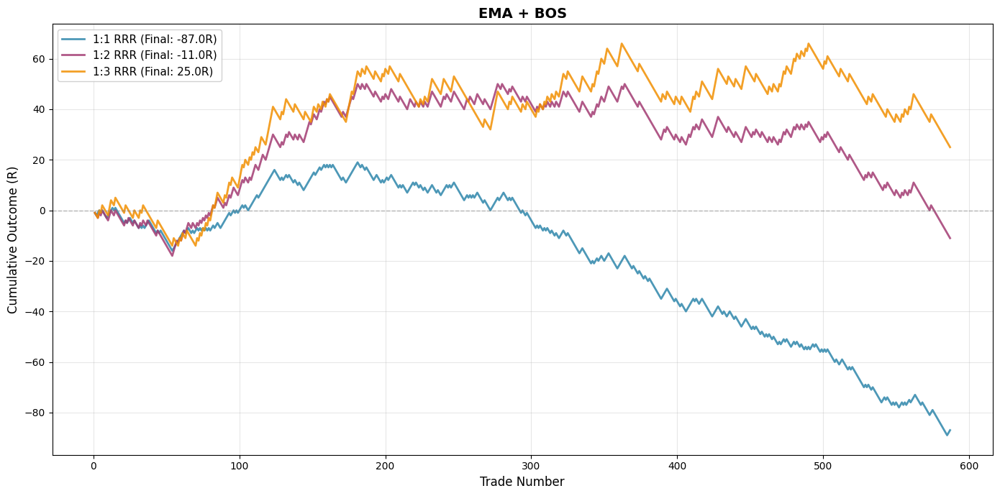

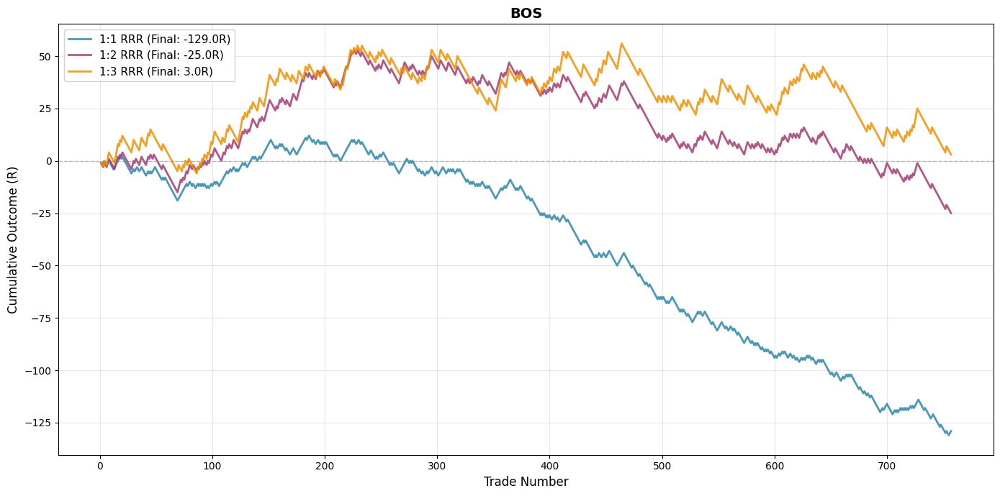

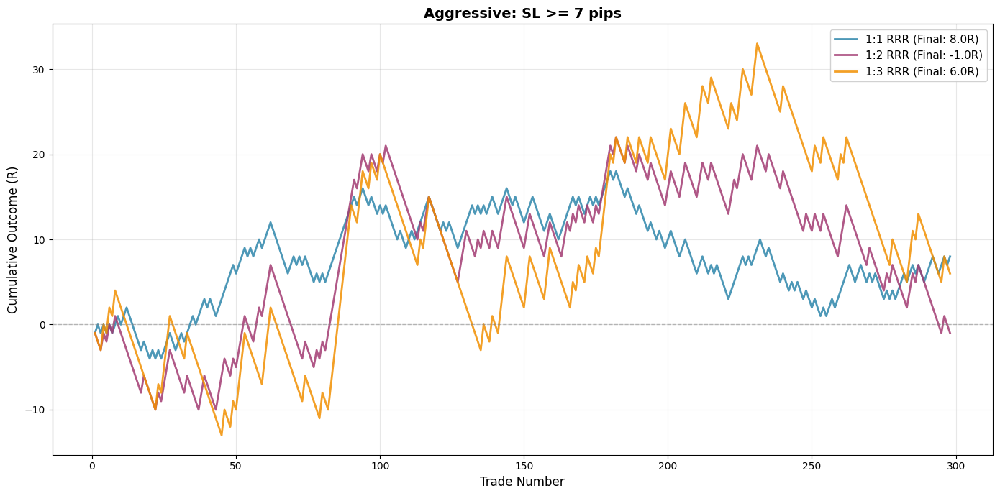

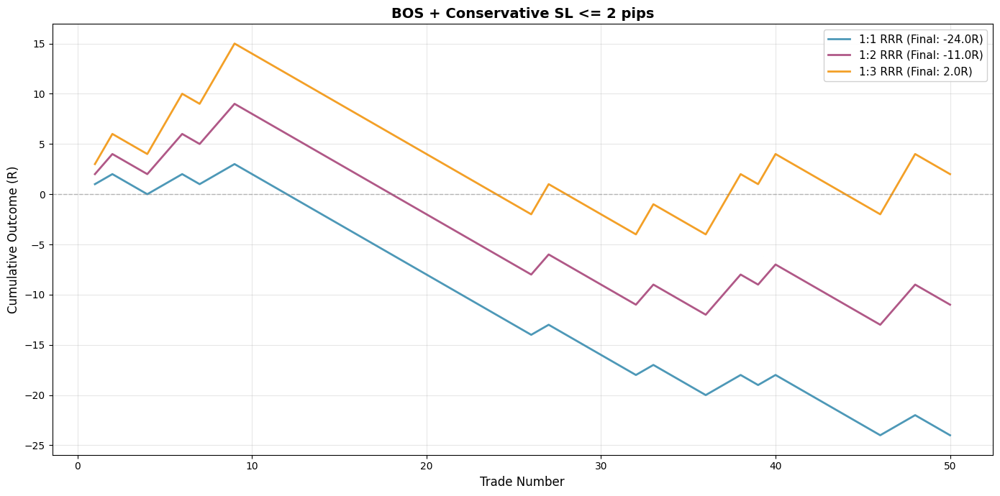

...

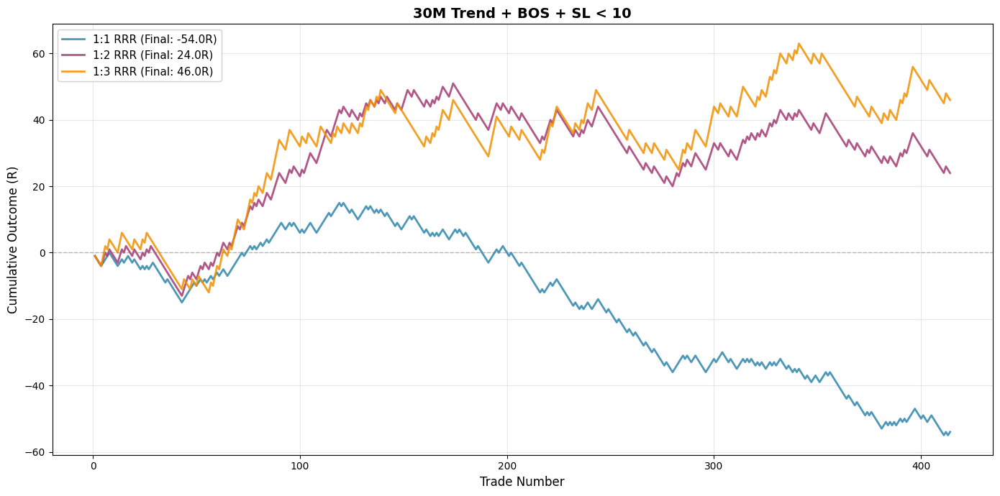

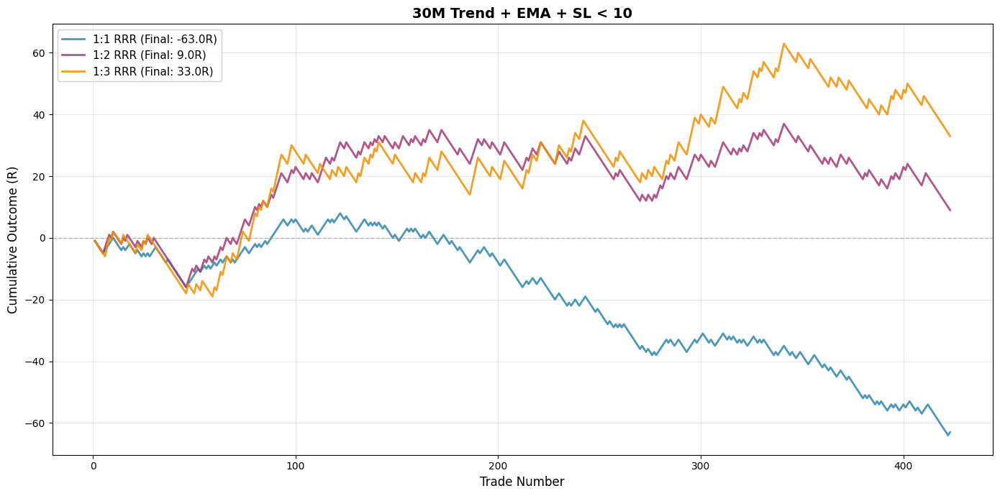

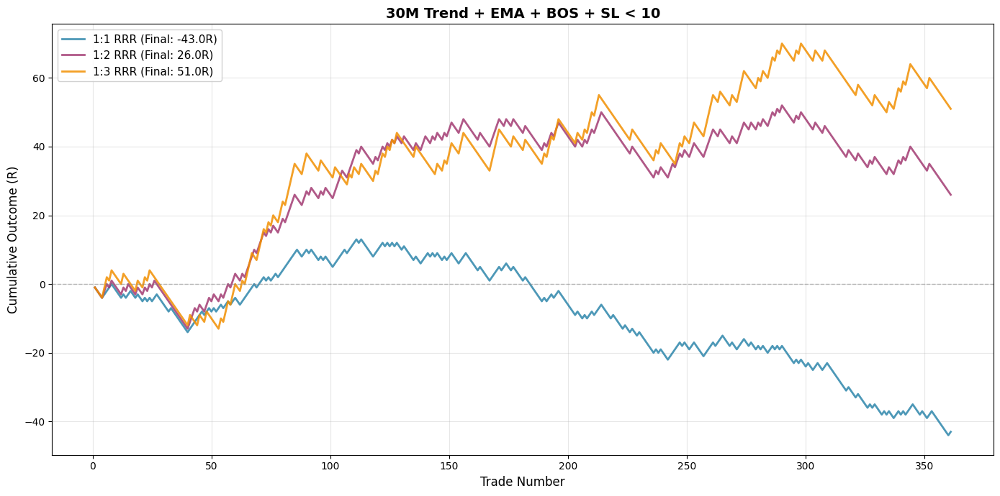

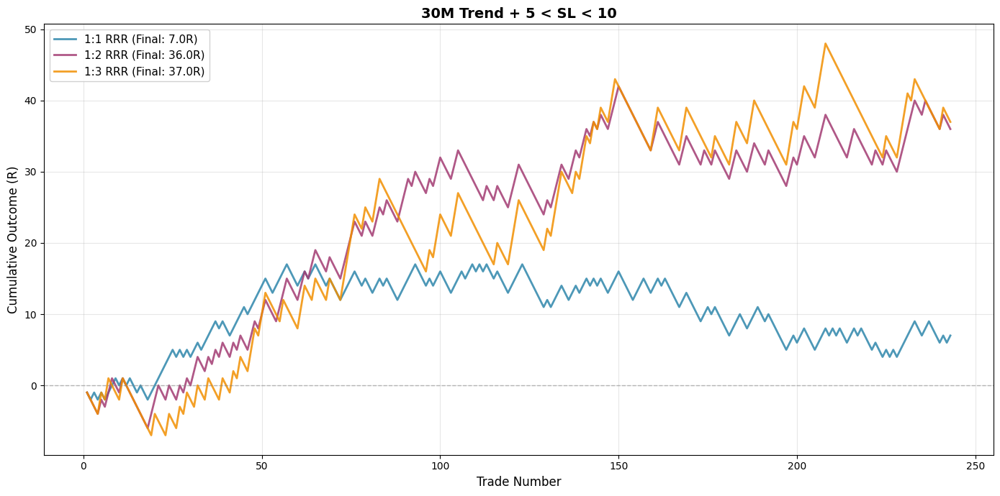

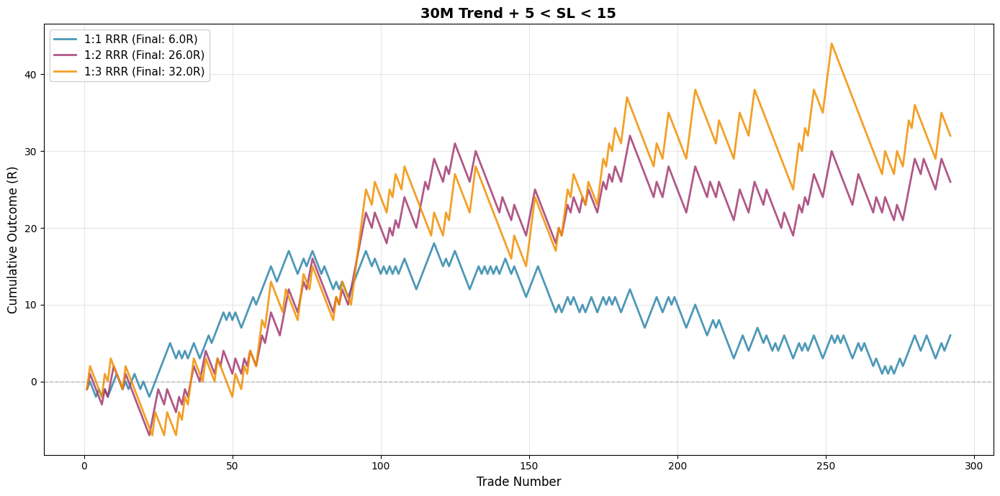

In [20]:
display_single_setup_strategy_charts(df)
display_double_setup_strategy_charts(df)
display_triple_setup_strategy_charts(df)

## Strategy Optimizer

In [21]:
custom_results = optimize_strategies(
    df,
    max_filters=4,
    min_filters=1,
    min_trades=400,
    max_trades=400,
    min_edge=0.0,
    rrr_ratios=[3],
    top_n=None
)

display_optimization_results(custom_results, title="Custom Optimization Results")

Generating strategy combinations (max 4 filters)...
Total combinations to test: 1235

Backtesting 1235 strategies...
  Processed 500/1235 strategies...
  Processed 1000/1235 strategies...

Optimization complete! Found 31 strategies meeting criteria.


,Strategy,RRR,Days,Days %,Trades,Wins,Losses,Outcome,Win %,Edge,Profit Factor,Expected Payoff,Drawdown %
1,SL=5-10,1:3,76,57%,400,116,284,64,29.0%,4.0%,1.23,0.16R,71.0%
2,BOS/CH=BOS + EMA=Aligned + SL=≤10,1:3,70,62%,400,115,285,60,28.7%,3.7%,1.21,0.15R,71.2%
3,30M Trend=Aligned + BOS/CH=BOS + EMA=Aligned,1:3,76,53%,400,114,286,56,28.5%,3.5%,1.20,0.14R,71.5%
4,30M Trend=Aligned + BOS/CH=BOS + SL=≤10,1:3,73,53%,400,114,286,56,28.5%,3.5%,1.20,0.14R,71.5%
5,30M Trend=Aligned + EMA=Aligned,1:3,69,55%,400,113,287,52,28.2%,3.2%,1.18,0.13R,71.8%
6,30M Trend=Aligned + BOS/CH=BOS,1:3,72,56%,400,113,287,52,28.2%,3.2%,1.18,0.13R,71.8%
7,EMA=Aligned + SL=≤10,1:3,65,64%,400,112,288,48,28.0%,3.0%,1.17,0.12R,72.0%
8,EMA=Aligned + SL=≤15,1:3,63,69%,400,112,288,48,28.0%,3.0%,1.17,0.12R,72.0%
9,EMA=Aligned,1:3,63,72%,400,112,288,48,28.0%,3.0%,1.17,0.12R,72.0%
10,30M Trend=Aligned + EMA=Aligned + SL=≤10,1:3,73,54%,400,112,288,48,28.0%,3.0%,1.17,0.12R,72.0%
